# 偉裕生技 銀耳專案

In [1]:
import os
import fnmatch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

rootpath = '/media/share/data/Tremella_fuciformis/'

# label cleaning

In [18]:
def label_cleaning(root_path):
    
    import os
    import numpy as np
    import pandas as pd
    import fnmatch

#     root_path = '/media/share/data/Tremella_fuciformis/'
    dirname = os.listdir(root_path)

    """
    cv and dnn to predict weightds of T
    < 55: F
    56-75: C
    76-95: B
    96-115: A
    """

    filename = []

    for pname, dname, fname in os.walk(root_path):
        files = fnmatch.filter(fname, '*.xlsx')
        filename.append(files)

    filename = list(filter(None, filename))

    df_all = pd.DataFrame([])
    for i, name in enumerate(dirname):
        subdirpath = os.path.join(root_path, name)
        csvname = fnmatch.filter(os.listdir(subdirpath), '*.xlsx')
        df0 = pd.read_excel(os.path.join(subdirpath, csvname[0]), header=1)

        df_sn = pd.DataFrame([name], columns=['sn'])
        df0_temp = pd.concat([df0['號碼.1'], df0['採收重量'], df0['新品種']], 1)
        df0_temp = df0_temp.dropna()
        df_temp = pd.concat([df_sn, df0_temp], 1)

        df_all = pd.concat([df_all, df_temp], 0)

    df_all.columns = ['SN', 'CanSN', 'Weight', 'Variety']
    
    return df_all

In [20]:
df = label_cleaning(rootpath)
df.head()

,SN,CanSN,Weight,Variety
0,T8-170705,4,99.000000,T1-2
1,NaN,6,91.375000,T3
2,NaN,7,76.208333,T8
4,NaN,3,63.125000,T3
5,NaN,4,95.083333,T1-2


# image preprocess

In [1]:
def define_roi(file):
    
    from skimage.color import rgb2gray
    from skimage.feature import canny
    from skimage.segmentation import clear_border
    from skimage.morphology import disk, closing, remove_small_objects, opening
    from skimage.filters import rank, sobel, threshold_otsu, threshold_local
    from scipy import ndimage

    img = plt.imread(file)
    if img.shape[0] > img.shape[1]:
        img = np.transpose(img, (1, 0, 2))
    
    # to grayscale
    img_g = rgb2gray(img)

    # find edges
    edges = canny(img_g, sigma=1.0,
                  low_threshold=0.1, 
                  high_threshold=0.5)

    # find rois
    thres_img = threshold_otsu(edges)
    edges_thres = edges > thres_img
    
    edges_thres = ndimage.binary_fill_holes(edges_thres)
    
    mark = sobel(edges_thres)
    mask = np.zeros_like(mark)
    mask[mark < 0] = 0
    mask[mark > 0] = 1
    c_rois = closing(mask, disk(12))
    c_rois = opening(mask, disk(6))
    
    thres_rois = threshold_local(c_rois, block_size=5, method='mean', mode='nearest')
    c_rois[thres_rois >= 1] = 1
    c_rois[thres_rois < 1] = 0

    # mean filter
    roi = rank.mean_bilateral(c_rois, selem=disk(64), s0=256, s1=256)
    mean_filter = roi.mean()
    roi[roi < mean_filter] = 0
    roi[roi >= mean_filter] = 1
    
    return img, roi

# preprocess from YH

In [21]:
from skimage import morphology
import cv2
def Convert8Bits(image, display_min, display_max): # copied from Bi Rico
    # Here I set copy=True in order to ensure the original image is not
    # modified. If you don't mind modifying the original image, you can
    # set copy=False or skip this step.
    image = np.array(image, copy=True)   
    image.clip(display_min, display_max, out=image)
    image -= display_min
    np.floor_divide(image, (display_max - display_min + 1) / 256,
                    out=image, casting='unsafe')       
    
    return image.astype(np.uint8)


#convert the image to 8-bit format
def MaskGenerator(inputImg):
    
    from skimage.color import rgb2gray
    from skimage.filters import sobel
    inputImg = rgb2gray(inputImg)
    inputImg = sobel(inputImg)
    
    rows, cols = inputImg.shape
    gap = 3
    tmp = Convert8Bits(inputImg, np.min(inputImg), np.max(inputImg))

    # Otsu's thresholding after Gaussian filtering 
    blur = cv2.GaussianBlur(tmp,(7,7),0)  
    ret,tmp_mask = cv2.threshold(blur[gap:rows-1, gap:cols-1],0,255, cv2.THRESH_OTSU)
    mask0 = np.zeros((rows, cols))
    mask0[tmp>ret] = 255          

    kernel = np.ones((11,11),np.uint8)
    mask1 = cv2.morphologyEx(tmp_mask, cv2.MORPH_CLOSE, kernel)
    
    final_mask = np.ones((mask1.shape[0]+2,mask1.shape[1]+2),np.uint8)
    final_mask[:] = 0
    
    flags = 8
    flags |= cv2.FLOODFILL_MASK_ONLY
    cv2.floodFill(mask1.astype(np.uint8), final_mask, (600,300), flags);
    final_mask_inv = cv2.bitwise_not(final_mask[1:mask1.shape[0]+1, 1:mask1.shape[1]+1])
    
    final_mask = cv2.GaussianBlur(final_mask,(59,59),0)
    final_mask[final_mask>60] = 255
            
    return final_mask

## 2.image process

/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


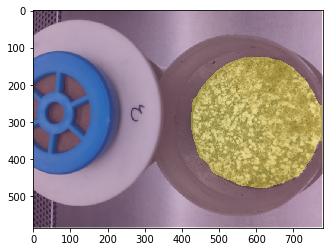

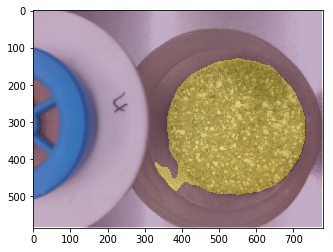

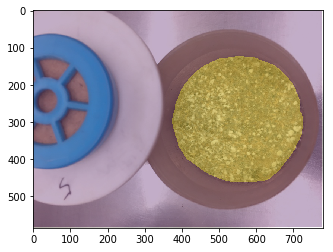

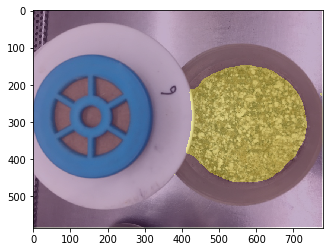

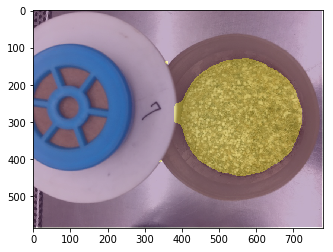

...

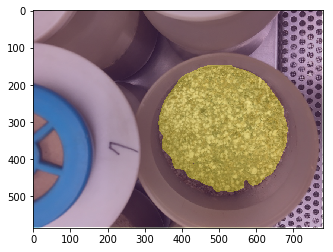

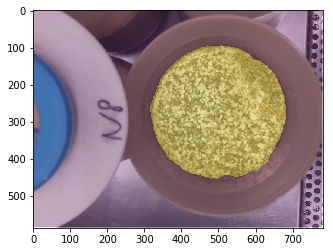

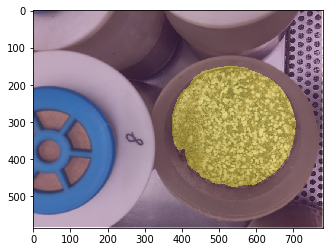

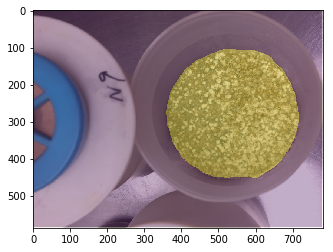

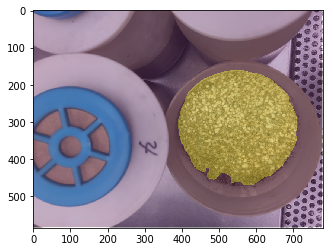

In [22]:
pdpath = os.listdir(rootpath)
img_df = pd.DataFrame([], columns=['image_array', 'img_path', 'image_name'])

num = 0

for i, pdname in enumerate(pdpath):
    img_name = fnmatch.filter(os.listdir(os.path.join(rootpath, pdname)), '*.jpg')
    
    num = num + len(img_name)
    for j, fname in enumerate(img_name):
        filename = rootpath + pdname + '/' + fname
        
        img = plt.imread(filename)
        roi = MaskGenerator(img)
#         img, roi = define_roi(filename)
        
        plt.figure()
        plt.imshow(roi, alpha=0.8)
        plt.imshow(img, alpha=0.6)
# print('All valid image file numeber :', num)

In [ ]:
pdpath = os.listdir(rootpath)
img_df = pd.DataFrame([], columns=['image_array', 'img_path', 'image_name'])

num = 0

for i, pdname in enumerate(pdpath):
    img_name = fnmatch.filter(os.listdir(os.path.join(rootpath, pdname)), '*.jpg')
    
    num = num + len(img_name)
    for j, fname in enumerate(img_name):
        filename = rootpath + pdname + '/' + fname
        
        img = plt.imread(filename)
        roi = MaskGenerator(img)
#         img, roi = define_roi(filename)
        
        plt.figure()
        plt.imshow(roi, alpha=0.8)
        plt.imshow(img, alpha=0.6)
# print('All valid image file numeber :', num)

In [ ]:
pdpath = os.listdir(rootpath)
img_df = pd.DataFrame([], columns=['image_array', 'img_path', 'image_name'])

num = 0

for i, pdname in enumerate(pdpath):
    img_name = fnmatch.filter(os.listdir(os.path.join(rootpath, pdname)), '*.jpg')
    
    num = num + len(img_name)
    for j, fname in enumerate(img_name):
        filename = rootpath + pdname + '/' + fname
        img, roi = define_roi(filename)
        
        plt.figure()
        plt.imshow(roi, alpha=0.8)
        plt.imshow(img, alpha=0.6)
# print('All valid image file numeber :', num)

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


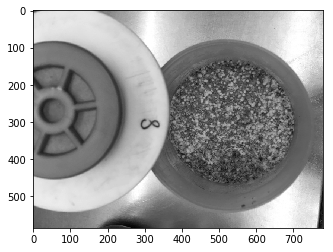

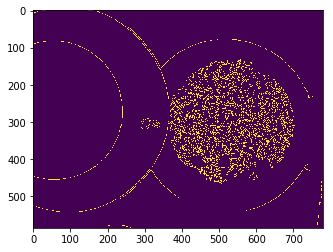

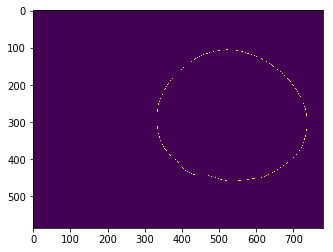

In [3]:
file = rootpath + 'T8-170705/image006.jpg'


from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.segmentation import clear_border, slic
from skimage.morphology import disk, closing
from skimage.filters import rank, sobel, threshold_local

# to grayscale
img = plt.imread(file)
img_g = rgb2gray(img)
plt.figure()
plt.imshow(img_g, cmap='gray')

# find edges
edges = canny(img_g, sigma=1.0,
              low_threshold=0.1, 
              high_threshold=0.5)

from skimage.filters import threshold_otsu
thres_img = threshold_otsu(edges)
test = edges > thres_img
plt.figure()
plt.imshow(test)

# find rois
mark = sobel(test)
mask = np.zeros_like(mark)
mask[mark <= 0] = 0
mask[mark > 0] = 1
c_rois = closing(mask, disk(8))

test = threshold_local(c_rois, block_size=3, method='gaussian', offset=0, mode='nearest', param=3)
test[test >= 1] = 1
test[test < 1] = 0

# mean filter
roi = rank.mean_bilateral(test, selem=disk(81), s0=256, s1=256)
mean_filter = np.mean(roi)
roi[roi <= mean_filter] = 0
roi[roi > mean_filter] = 1

from skimage.segmentation import find_boundaries
roi_label = find_boundaries(roi, mode='inner')
plt.figure()
plt.imshow(roi_label)

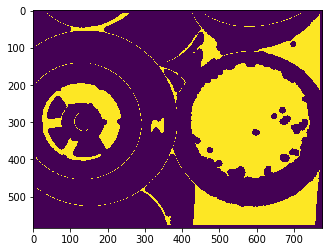

In [9]:
file = rootpath + 'T8-170804/image002.jpg'
# file = rootpath + 'T8-170830/image002.jpg'


from skimage import color, filters, measure
from skimage import img_as_ubyte, morphology
from skimage import draw
from sklearn.cluster import MeanShift
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.segmentation import clear_border, slic
from skimage.morphology import disk, closing
from skimage.filters import rank, sobel, threshold_local
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.draw import circle_perimeter
from scipy.ndimage import gaussian_filter
from skimage.morphology import reconstruction


# to grayscale
img = plt.imread(file)
img_g = rgb2gray(img)
# dilation
# seed = np.copy(img_g)
# seed[1:-1, 1:-1] = img_g.min()
# mask = img_g

# dilated = reconstruction(seed, mask, method='dilation')
# d_img = img_g - dilated

# find edges
edges = canny(img_g, sigma=1.0,
              low_threshold=0.1, 
              high_threshold=0.5)

from skimage.filters import threshold_otsu
thres_img = threshold_otsu(edges)
otsu_img = edges > thres_img

from scipy import ndimage
fill_holes = ndimage.binary_fill_holes(otsu_img)
closing_img = morphology.binary_closing(fill_holes, selem=disk(8))


plt.figure()
plt.imshow(closing_img)


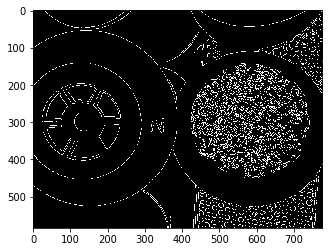

In [8]:
plt.imshow(edges - thres_img, cmap='gray')

ValueError: shape mismatch: value array of shape (3,) could not be broadcast to indexing result of shape (1424,)

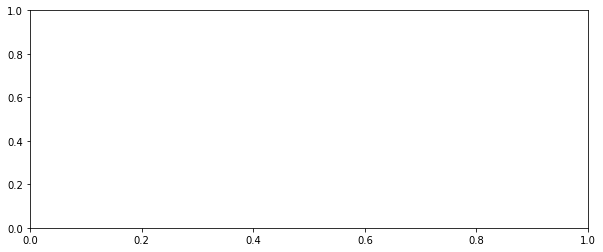

In [11]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
# image = color.gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    test[circy, circx] = (220, 20, 20)

ax.imshow(test, cmap=plt.cm.gray)
plt.show()

In [7]:
img_label=measure.label(test)
region=measure.regionprops(img_label)

In [ ]:
for i in region:
    plt.figure()
    print(i.centroid, i.area)
    plt.imshow(i.filled_image)

In [ ]:
plt.imshow(img_label)

In [ ]:
test_seg = slic(img_label, n_segments=5)

In [ ]:
# find long size　ａｎｄ　ｄｒｏｐ　３５％
if test.shape[1] > test.shape[0]:
    new_img = test[:, round(0.35*test.shape[1]):]
else:
    new_img = test[round(0.35*test.shape[0]):, :]

In [ ]:
for i in region:
    print(i.area)

In [ ]:
bandwidth=round(np.sqrt(209662/np.pi))

In [ ]:
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, cluster_all=False)

In [11]:
roi_where = np.where(test)

In [ ]:
measure.regionprops??

In [14]:
roi_where[0]

array([  8,   8,   8, ..., 575, 575, 575])

In [15]:
test = np.matrix(roi_where)

In [17]:
TEST22 = test.T

In [18]:
TEST22

matrix([[  8,  37],
        [  8,  38],
        [  8, 239],
        ..., 
        [575, 753],
        [575, 754],
        [575, 755]])